# Import Libraries

In [5]:
# Import core libraries
import pandas as pd  # For data manipulation and analysis
import numpy as np   # For numerical operations

# Import visualization libraries
import matplotlib.pyplot as plt  # For creating plots
import seaborn as sns  # For enhanced data visualization

# Load Dataset

In [6]:
# Load the dataset
dataset_path = r"C:\Users\DELL\OneDrive\Desktop1\Data Analyst Tasks - Cognifyz Technologies\Level - 2\Dataset .csv"
data = pd.read_csv(dataset_path)

# Analyze the Distribution of Aggregate Ratings and Determine the Most Common Rating Range

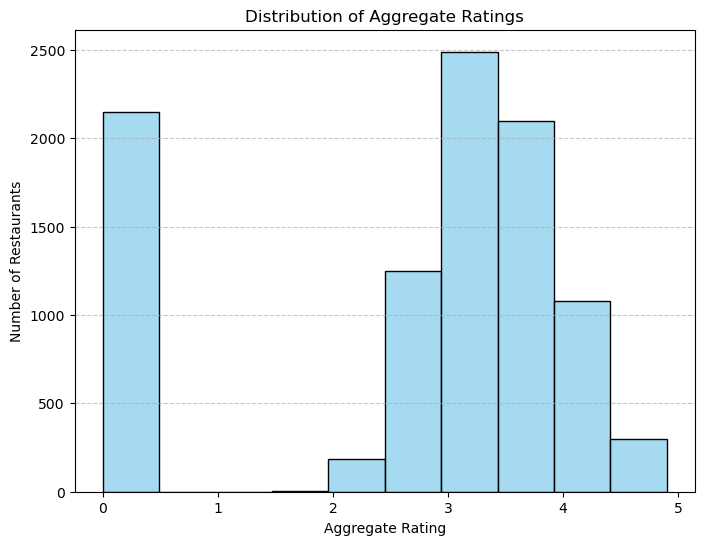

In [7]:
# Analyze the distribution of aggregate ratings
plt.figure(figsize=(8, 6))
sns.histplot(data['Aggregate rating'], bins=10, kde=False, color='skyblue', edgecolor='black')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Restaurants')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Determine the Most Common Rating Range

In [8]:
# Round ratings to the nearest interval (e.g., 0.5 or 1) and count occurrences
rating_counts = data['Aggregate rating'].round(1).value_counts().sort_index()

# Find the most common rating range
most_common_rating = rating_counts.idxmax()
most_common_rating_count = rating_counts.max()

# Display the result
print(f"The most common rating range is {most_common_rating}, appearing {most_common_rating_count} times.")

The most common rating range is 0.0, appearing 2148 times.


# Calculate the Average Number of Votes Received by Restaurants

In [9]:
# Calculate the average number of votes received
average_votes = data['Votes'].mean()

# Display the result
print(f"The average number of votes received by restaurants is {average_votes:.2f}.")

The average number of votes received by restaurants is 156.91.


# Highlight Rating and Votes Correlation

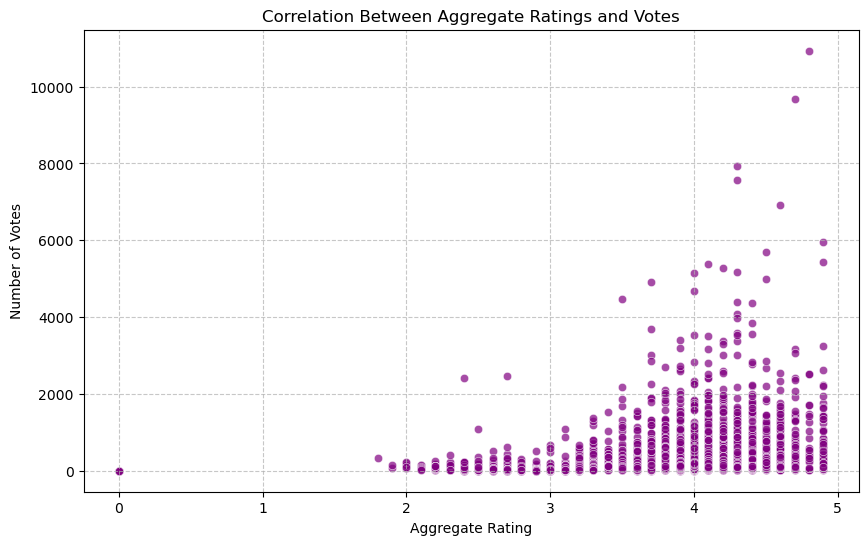

In [10]:
# Scatter plot of Aggregate Ratings vs Votes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Aggregate rating', y='Votes', data=data, alpha=0.7, color='purple')
plt.title('Correlation Between Aggregate Ratings and Votes')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Votes')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()

# Identify the Most Common Combinations of Cuisines

In [11]:
# Count the frequency of each cuisine combination
cuisine_combinations = data['Cuisines'].value_counts()

# Display the top 10 most common cuisine combinations
top_cuisine_combinations = cuisine_combinations.head(10)

# Display the result
print("Top 10 Most Common Cuisine Combinations:")
print(top_cuisine_combinations)

Top 10 Most Common Cuisine Combinations:
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


Visualization

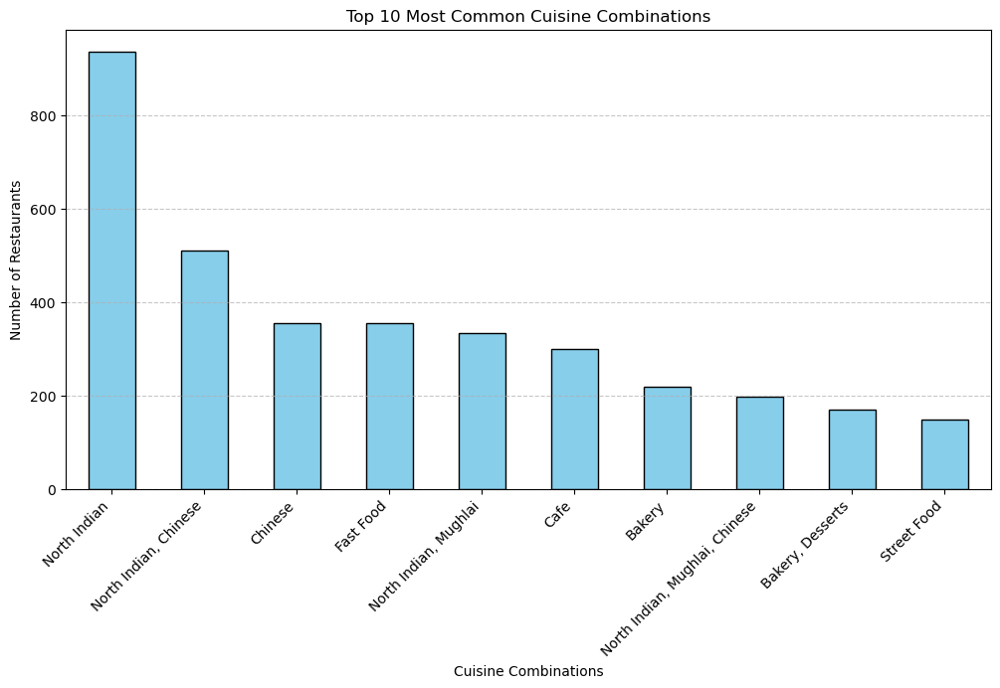

In [12]:
# Bar chart for the top 10 cuisine combinations
plt.figure(figsize=(12, 6))
top_cuisine_combinations.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Top 10 Most Common Cuisine Combinations')
plt.xlabel('Cuisine Combinations')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Determine if Certain Cuisine Combinations Tend to Have Higher Ratings

In [13]:
# Group by 'Cuisines' and calculate the average rating for each combination
average_rating_by_cuisine = data.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)

# Display the top 10 cuisine combinations with the highest average ratings
top_rated_cuisine_combinations = average_rating_by_cuisine.head(10)

# Display the result
print("Top 10 Cuisine Combinations with the Highest Average Ratings:")
print(top_rated_cuisine_combinations)

Top 10 Cuisine Combinations with the Highest Average Ratings:
Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


Visualization

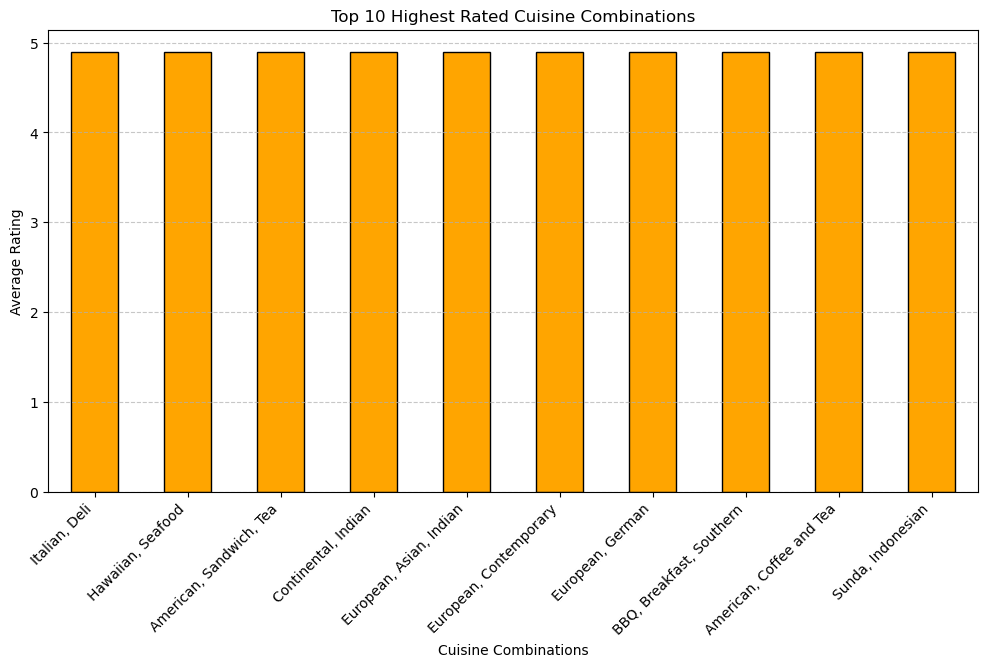

In [14]:
# Bar chart for the top 10 cuisine combinations by average rating
plt.figure(figsize=(12, 6))
top_rated_cuisine_combinations.plot(kind='bar', color='orange', edgecolor='black')
plt.title('Top 10 Highest Rated Cuisine Combinations')
plt.xlabel('Cuisine Combinations')
plt.ylabel('Average Rating')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Plot the Locations of Restaurants on a Map

In [15]:
! pip install folium

In [16]:
import folium

# Create a map centered at the mean latitude and longitude of the dataset
mean_lat = data['Latitude'].mean()
mean_lon = data['Longitude'].mean()
restaurant_map = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Add points for each restaurant
for _, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Restaurant: {row['Restaurant Name']}\nRating: {row['Aggregate rating']}"
    ).add_to(restaurant_map)

# Display the map
restaurant_map

# Identify Patterns or Clusters of Restaurants

In [17]:
from folium.plugins import HeatMap

# Prepare data for the heatmap
heatmap_data = data[['Latitude', 'Longitude']].dropna()

# Create a heatmap
restaurant_heatmap = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)
HeatMap(data=heatmap_data.values, radius=10, blur=15).add_to(restaurant_heatmap)

# Display the heatmap
restaurant_heatmap

# Identify if There Are Any Restaurant Chains in the Dataset

In [18]:
# Count the number of occurrences of each restaurant name
restaurant_counts = data['Restaurant Name'].value_counts()

# Filter to find restaurant chains (names with more than one occurrence)
restaurant_chains = restaurant_counts[restaurant_counts > 1]

# Display the result
print("Restaurant Chains Identified:")
print(restaurant_chains)

Restaurant Chains Identified:
Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64


# Analyze the Ratings and Popularity of Different Restaurant Chains

In [19]:
# Filter data to include only restaurant chains
chain_data = data[data['Restaurant Name'].isin(restaurant_chains.index)]

# Group by 'Restaurant Name' and calculate average rating and total votes
chain_performance = chain_data.groupby('Restaurant Name').agg({
    'Aggregate rating': 'mean',
    'Votes': 'sum'
}).sort_values(by='Votes', ascending=False)

# Display the result
print("Performance of Restaurant Chains:")
print(chain_performance.head(10))

Performance of Restaurant Chains:
                           Aggregate rating  Votes
Restaurant Name                                   
Barbeque Nation                    4.353846  28142
AB's - Absolute Barbecues          4.825000  13400
Big Chill                          4.475000  10853
Farzi Cafe                         4.366667  10098
Truffles                           3.950000   9682
Chili's                            4.580000   8156
Joey's Pizza                       4.250000   7807
Big Yellow Door                    4.266667   7511
Saravana Bhavan                    4.133333   7238
Starbucks                          3.805556   7139


# Top 10 Restaurant Chains by Average Rating

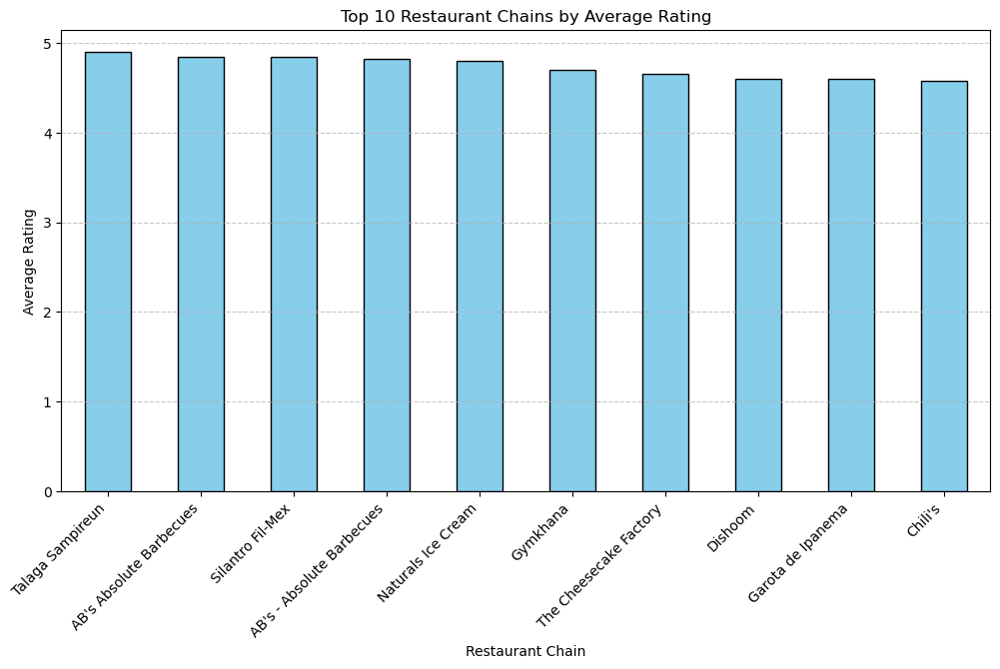

In [20]:
# Top 10 chains by average rating
top_chains_by_rating = chain_performance.sort_values(by='Aggregate rating', ascending=False).head(10)

plt.figure(figsize=(12, 6))
top_chains_by_rating['Aggregate rating'].plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Top 10 Restaurant Chains by Average Rating')
plt.xlabel('Restaurant Chain')
plt.ylabel('Average Rating')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Top 10 Restaurant Chains by Popularity (Votes)

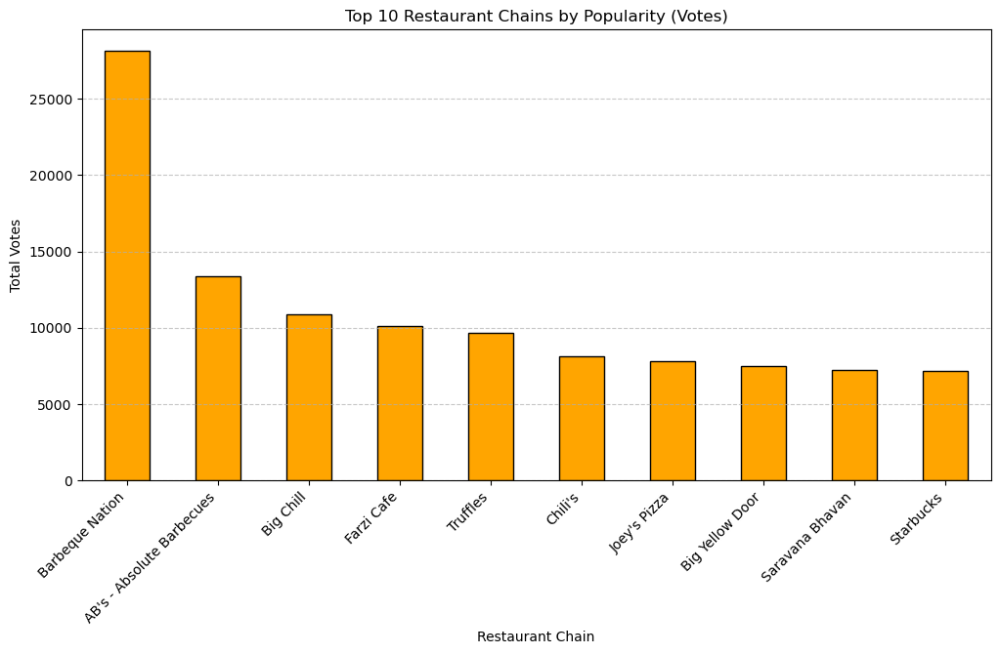

In [21]:
# Top 10 chains by total votes
top_chains_by_votes = chain_performance.sort_values(by='Votes', ascending=False).head(10)

plt.figure(figsize=(12, 6))
top_chains_by_votes['Votes'].plot(kind='bar', color='orange', edgecolor='black')
plt.title('Top 10 Restaurant Chains by Popularity (Votes)')
plt.xlabel('Restaurant Chain')
plt.ylabel('Total Votes')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()